<a href="https://colab.research.google.com/github/Biswamitra4599/MRI_Literature_Review/blob/main/MRI_Recon_normal_rss_and__tests.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#RSS

## Importing System Libraries & Mounting Drive


In [ ]:
import os
import sys
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from IPython.display import Image
import h5py
import glob
import shutil
import subprocess

In [ ]:
#Mounting Google Drive
from google.colab import drive
# !rm -rf drive

drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
def delete_path(path_to_delete):
  if os.path.exists(path_to_delete) and os.path.isdir(path_to_delete):
    try:
      # Force delete the directory and all its contents
      shutil.rmtree(path_to_delete)
      print(f"Directory '{path_to_delete}' and all its contents have been deleted.")
    except Exception as e:
      print(f"Error while deleting the directory: {e}")
  else:
    print(f"The directory '{path_to_delete}' does not exist.")

def create_path(path_to_create):
  if not os.path.exists(path_to_create):
    os.makedirs(path_to_create)
    print(f"Path Created!!! Put the '.h5' files in the specific place: {path_to_create}")
  else:
    print("Path Already Exists!!")

In [ ]:
# Remove an empty directory
mri_path="/content/drive/MyDrive/MRI/"
cfl_path=mri_path+"CFL/"
buffer_path=mri_path+"BUFFER/"
h5_path=mri_path+"H5/"
test_path=mri_path+"TEST/"
# Clearning the Buffer if exixts
delete_path(buffer_path)
bash_path=mri_path+"BASH/"

Directory '/content/drive/MyDrive/MRI/BUFFER/' and all its contents have been deleted.


In [ ]:
# Managing the Paths to avoid any Error
if not os.path.exists(mri_path):
  os.makedirs(mri_path)
  os.makedirs(cfl_path)
  os.makedirs(buffer_path)
  os.makedirs(h5_path)
  os.makedirs(test_path)
  print(f"Path Created!!! Put the '.h5' files in the specific place: {h5_path}")
else:
  os.makedirs(buffer_path)
  print("Path Already Exists!!")


Path Already Exists!!


## Finalized Functions::

### Loading  the files

In [ ]:
# Get a list of all .h5 files in the directory
def get_file_list():
    h5_files = glob.glob(os.path.join(h5_path, "*.h5"))
    ll=[]

    for h5_file in h5_files:
      temp=h5_file.replace(h5_path,"")
      temp=temp.replace(".h5","")
      ll.append(temp)
    return ll

#Getting User Input on Image
def get_user_input(ll):
    for index,tt in enumerate(ll):
      print(index,":\t", tt)
    print("\nEnter the index of the file name from the above list: ")
    ins = input()
    return int(ins)


#Extracting Volume K Space for specified Image.
def get_volume_kspace(h5_file_name):
    hf= h5py.File(h5_file_name)
    volume_kspace = hf['kspace'][()]
    return volume_kspace


def process_h5_file(h5_file_name, slice_no):
    h5_file_path=h5_path+h5_file_name+".h5"
    h5_file_cfl_dict=cfl_path+h5_file_name+"/"
    create_path(h5_file_cfl_dict)

    #Getting the Volume K Space Data
    volume_kspace = get_volume_kspace(h5_file_path)
    print("H5 five file size:",volume_kspace.shape)
    slice_nos=volume_kspace.shape[0]
    print("No of slices are:",slice_nos)
    print("*****\tFor Slice No.: ",slice_no,"\t*********")

    # Extracting Slice from volume K Space
    slice_kspace = volume_kspace[slice_no]
    print("Slice K-Space size: ",slice_kspace.shape)

In [ ]:
# H5 File Reading
h5_file_list=get_file_list()
ins=get_user_input(h5_file_list)
h5_file_name=h5_file_list[int(ins)]
print(h5_file_name)

0 :	 file_brain_AXFLAIR_200_6002452
1 :	 file_brain_AXFLAIR_200_6002467
2 :	 file_brain_AXT1POST_201_6002673
3 :	 file_brain_AXT2_210_6001944
4 :	 sc_file1000001
5 :	 sc_file1000022

Enter the index of the file name from the above list: 
0
file_brain_AXFLAIR_200_6002452


In [ ]:
h5_file_path=h5_path+h5_file_name+".h5"
h5_file_cfl_dict=cfl_path+h5_file_name+"/"
create_path(h5_file_cfl_dict)

slice_no=0
#Getting the Volume K Space Data
volume_kspace = get_volume_kspace(h5_file_path)
print("H5 five file size:",volume_kspace.shape)
slice_nos=volume_kspace.shape[0]
print("No of slices are:",slice_nos)
print("*****\tFor Slice No.: ",slice_no,"\t*********")

# Extracting Slice from volume K Space
slice_kspace = volume_kspace[slice_no]
print("Slice K-Space size: ",slice_kspace.shape)

Path Already Exists!!
H5 five file size: (16, 20, 640, 320)
No of slices are: 16
*****	For Slice No.:  0 	*********
Slice K-Space size:  (20, 640, 320)


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

# def plot_kspace_and_images(slice_kspace, show_type="both", coil_axis=0):
#     """
#     Plot MRI data from k-space and/or I-space.

#     Parameters
#     ----------
#     slice_kspace : np.ndarray
#         k-space data of shape (ncoils, nx, ny).
#     show_type : str
#         "kspace", "image", or "both".
#     coil_axis : int
#         Axis where coil dimension is located (default 0).
#     """

#     # Ensure coil axis is first
#     if coil_axis != 0:
#         slice_kspace = np.moveaxis(slice_kspace, coil_axis, 0)

#     ncoils = slice_kspace.shape[0]

#     # Create I-space images
#     slice_images = np.fft.ifftshift(np.fft.ifft2(np.fft.fftshift(slice_kspace, axes=(-2, -1)), axes=(-2, -1)), axes=(-2, -1))
#     slice_images = np.abs(slice_images)

#     # Titles
#     if show_type == "both":
#         nplots = 2
#     else:
#         nplots = 1

#     # Grid size (4 per row)
#     ncols = 4
#     nrows = int(np.ceil(ncoils / ncols)) * nplots

#     fig, axes = plt.subplots(nrows, ncols, figsize=(3*ncols, 3*nrows))
#     axes = axes.flatten()

#     idx = 0
#     for c in range(ncoils):
#         if show_type in ["kspace", "both"]:
#             axes[idx].imshow(np.log1p(np.abs(slice_kspace[c])), cmap="gray")
#             axes[idx].set_title(f"Coil {c} K-space")
#             axes[idx].axis("off")
#             idx += 1

#         if show_type in ["image", "both"]:
#             axes[idx].imshow(slice_images[c], cmap="gray")
#             axes[idx].set_title(f"Coil {c} Image")
#             axes[idx].axis("off")
#             idx += 1

#     # Hide extra axes
#     for ax in axes[idx:]:
#         ax.axis("off")

#     plt.tight_layout()
#     plt.show()


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt

# def plot_kspace_and_images(slice_kspace, show_type="both", coil_axis=0,
#                            add_labels=True, label_inside=False,
#                            wgap=0.05, hgap=0.2):
#     """
#     Plot MRI coil k-space and/or image-space data with correct aspect ratio.
#     """
#     # Ensure coil axis is first
#     if coil_axis != 0:
#         slice_kspace = np.moveaxis(slice_kspace, coil_axis, 0)

#     ncoils, nx, ny = slice_kspace.shape

#     # Make image space
#     slice_images = np.fft.ifftshift(
#         np.fft.ifft2(np.fft.fftshift(slice_kspace, axes=(-2, -1)), axes=(-2, -1)),
#         axes=(-2, -1)
#     )
#     slice_images = np.abs(slice_images)

#     imgs, labels = [], []
#     for c in range(ncoils):
#         if show_type in ["kspace", "both"]:
#             imgs.append(np.log1p(np.abs(slice_kspace[c])))
#             labels.append(f"Coil {c} K-space")
#         if show_type in ["image", "both"]:
#             imgs.append(slice_images[c])
#             labels.append(f"Coil {c} Image")

#     nimgs = len(imgs)
#     ncols = 4
#     nrows = int(np.ceil(nimgs / ncols))

#     # maintain image aspect ratio: width/height = ny/nx
#     aspect_ratio = ny / nx
#     fig, axes = plt.subplots(
#         nrows, ncols,
#         figsize=(ncols * 5 * aspect_ratio, nrows * 5)
#     )
#     axes = axes.flatten()

#     for i, (im, lab) in enumerate(zip(imgs, labels)):
#         axes[i].imshow(im / np.max(im), cmap="gray", aspect="auto")
#         axes[i].axis("off")
#         if add_labels:
#             if label_inside:
#                 axes[i].text(0.5, 0.05, lab, ha="center", va="bottom", fontsize=8,
#                              color="white", transform=axes[i].transAxes,
#                              bbox=dict(facecolor="black", alpha=0.5, pad=1, edgecolor="none"))
#             else:
#                 axes[i].set_title(lab, fontsize=8)

#     for j in range(i+1, len(axes)):
#         axes[j].axis("off")

#     plt.subplots_adjust(wspace=wgap, hspace=hgap)
#     plt.show()


import os
import numpy as np
import matplotlib.pyplot as plt

def plot_kspace_and_images(slice_kspace, show_type="both", coil_axis=0,
                           add_labels=True, label_inside=False,
                           wgap=0.05, hgap=0.2,
                           save_path=None, save_images=False,
                           slices=None):
    """
    Plot MRI coil k-space and/or image-space data with correct aspect ratio.

    Parameters:
    - slice_kspace: numpy array of shape (ncoils, nx, ny) or (nslices, ncoils, nx, ny)
    - show_type: "kspace", "image", or "both"
    - coil_axis: axis representing coil dimension
    - save_path: folder to save images
    - save_images: whether to save images
    - slices: list of slice indices to select from a multi-slice dataset
    """

    # Handle multiple slices
    if slices is not None:
        slice_kspace = slice_kspace[slices]

    # Ensure coil axis is first
    if coil_axis != 0:
        slice_kspace = np.moveaxis(slice_kspace, coil_axis, 0)

    # Determine if multiple slices exist
    if slice_kspace.ndim == 4:
        nslices, ncoils, nx, ny = slice_kspace.shape
    else:
        nslices = 1
        ncoils, nx, ny = slice_kspace.shape
        slice_kspace = slice_kspace[np.newaxis, ...]  # add slice axis for uniformity

    slice_images = np.fft.ifftshift(
        np.fft.ifft2(np.fft.fftshift(slice_kspace, axes=(-2, -1)), axes=(-2, -1)),
        axes=(-2, -1)
    )
    slice_images = np.abs(slice_images)

    for s in range(nslices):
        imgs, labels = [], []
        for c in range(ncoils):
            if show_type in ["kspace", "both"]:
                imgs.append(np.log1p(np.abs(slice_kspace[s, c])))
                labels.append(f"Slice{s}_Coil{c}_Kspace")
            if show_type in ["image", "both"]:
                imgs.append(slice_images[s, c])
                labels.append(f"Slice{s}_Coil{c}_Image")

        nimgs = len(imgs)
        ncols = 4
        nrows = int(np.ceil(nimgs / ncols))

        aspect_ratio = ny / nx
        fig, axes = plt.subplots(
            nrows, ncols,
            figsize=(ncols * 5 * aspect_ratio, nrows * 5)
        )
        axes = axes.flatten()

        for i, (im, lab) in enumerate(zip(imgs, labels)):
            axes[i].imshow(im / np.max(im), cmap="gray", aspect="auto")
            axes[i].axis("off")
            if add_labels:
                if label_inside:
                    axes[i].text(0.5, 0.05, lab, ha="center", va="bottom", fontsize=8,
                                 color="white", transform=axes[i].transAxes,
                                 bbox=dict(facecolor="black", alpha=0.5, pad=1, edgecolor="none"))
                else:
                    axes[i].set_title(lab, fontsize=8)

        for j in range(i+1, len(axes)):
            axes[j].axis("off")

        plt.subplots_adjust(wspace=wgap, hspace=hgap)

        if save_images and save_path is not None:
            os.makedirs(save_path, exist_ok=True)
            for im, lab in zip(imgs, labels):
                filename = f"{lab}.png"
                full_path = os.path.join(save_path, filename)
                plt.imsave(full_path, im / np.max(im), cmap="gray")

    plt.show()



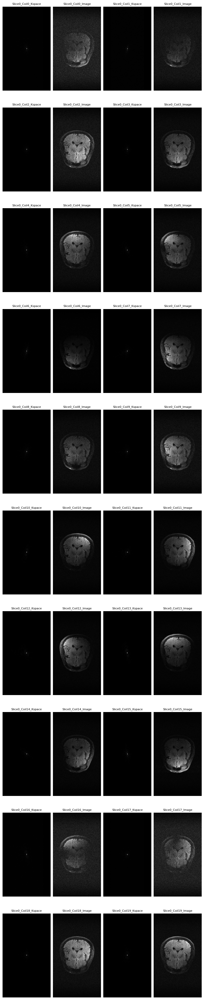

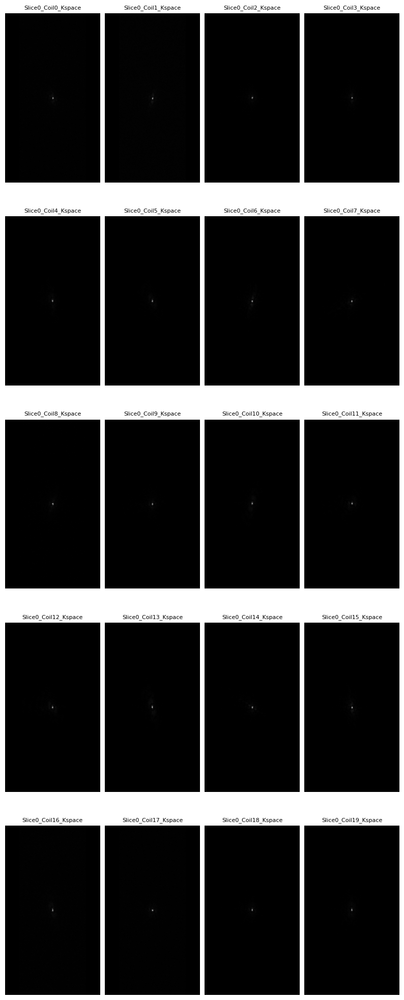

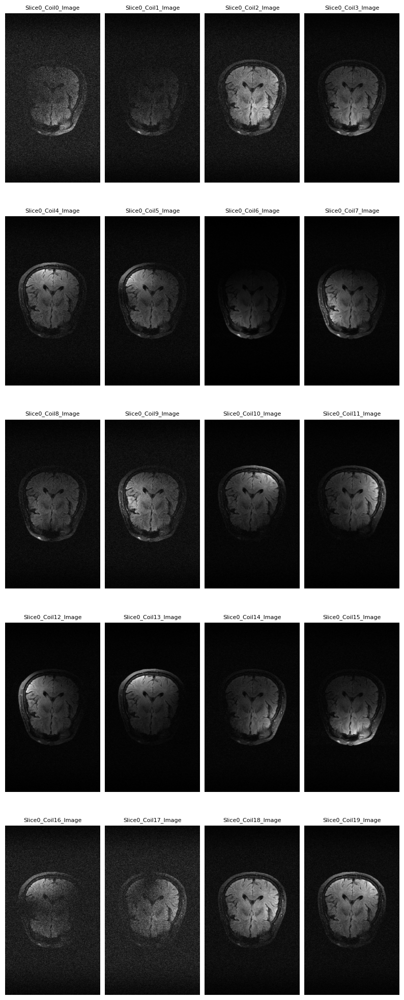

In [ ]:
# For your slice
plot_kspace_and_images(slice_kspace, show_type="both")  # plots both k-space and image-space
plot_kspace_and_images(slice_kspace, show_type="kspace")  # only k-space
plot_kspace_and_images(slice_kspace, show_type="image")   # only image-space


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_coils_individually(slice_kspace, coil_axis=0, show_type="both", scale=3):
    """
    Plot each coil separately with k-space and/or image-space side by side,
    keeping correct aspect ratio.

    Parameters
    ----------
    slice_kspace : np.ndarray
        K-space data for one slice, shape (ncoils, nx, ny).
    coil_axis : int
        Axis for coils (default 0).
    show_type : str
        "kspace", "image", or "both".
    scale : float
        Scale factor for figure size (increase for larger plots).
    """
    # Ensure coil axis first
    if coil_axis != 0:
        slice_kspace = np.moveaxis(slice_kspace, coil_axis, 0)

    ncoils, nx, ny = slice_kspace.shape
    aspect_ratio = ny / nx  # width / height

    # Compute image-space
    slice_images = np.fft.ifftshift(
        np.fft.ifft2(np.fft.fftshift(slice_kspace, axes=(-2, -1)), axes=(-2, -1)),
        axes=(-2, -1)
    )
    slice_images = np.abs(slice_images)

    for c in range(ncoils):
        if show_type == "both":
            fig, axes = plt.subplots(
                1, 2, figsize=(2 * scale * aspect_ratio, scale)
            )
        else:
            fig, axes = plt.subplots(
                1, 1, figsize=(scale * aspect_ratio, scale)
            )
            axes = [axes]

        if show_type in ["kspace", "both"]:
            axes[0].imshow(np.log1p(np.abs(slice_kspace[c])), cmap="gray", aspect="auto")
            axes[0].set_title(f"Coil {c} K-space")
            axes[0].axis("off")

        if show_type in ["image", "both"]:
            idx = 1 if show_type == "both" else 0
            axes[idx].imshow(slice_images[c] / np.max(slice_images[c]), cmap="gray", aspect="auto")
            axes[idx].set_title(f"Coil {c} Image")
            axes[idx].axis("off")

        plt.tight_layout()
        plt.show()


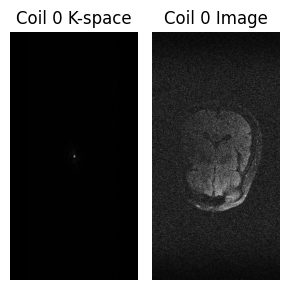

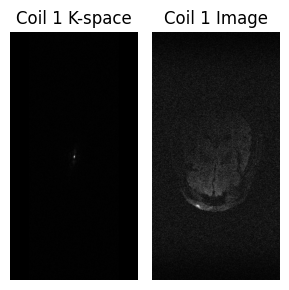

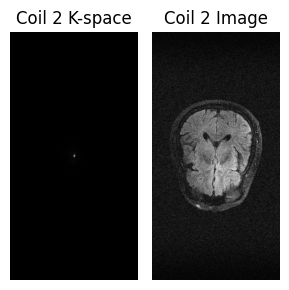

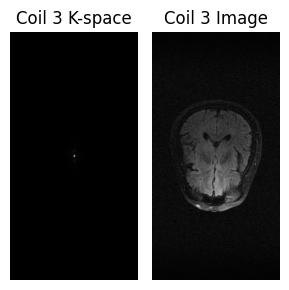

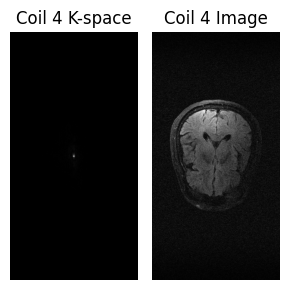

...

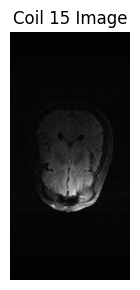

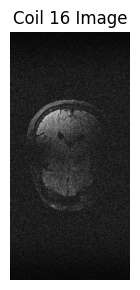

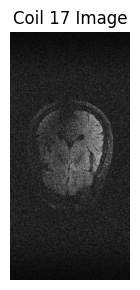

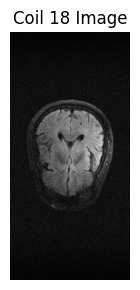

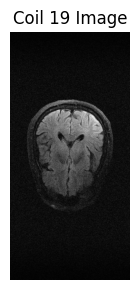

In [ ]:
# Show both k-space and image for each coil
plot_coils_individually(slice_kspace, show_type="both")

# Show only k-space per coil
plot_coils_individually(slice_kspace, show_type="kspace")

# Show only image-space per coil
plot_coils_individually(slice_kspace, show_type="image")


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_rss_and_coils(slice_kspace, coil_axis=0, show_coils=True,
                       show_rss=True, scale=6, ncols=4, cmap="gray",
                       interpolation="nearest"):
    """
    Plot coil-wise k-space images (or coil images) and RSS without squeezing.

    Parameters
    ----------
    slice_kspace : ndarray
        shape (ncoils, nx, ny) or with coil_axis specified.
    coil_axis : int
        axis index of coils in slice_kspace.
    show_coils : bool
        show individual coil image-space images (True).
    show_rss : bool
        show RSS combined image (True).
    scale : float
        Base height (in inches) for plotting one image; width is scaled by image aspect.
    ncols : int
        # columns when plotting coil images in a grid (only used if show_coils True and multiple).
    cmap : str
        colormap for imshow.
    interpolation : str
        interpolation argument for imshow (use "nearest" to avoid smoothing artifacts).
    Returns
    -------
    rss_image : ndarray
        computed RSS image (abs, not normalized).
    """
    # move coil axis to front
    if coil_axis != 0:
        slice_kspace = np.moveaxis(slice_kspace, coil_axis, 0)
    ncoils, nx, ny = slice_kspace.shape  # nx = rows (height), ny = cols (width)
    # compute coil images
    coil_images = np.fft.ifftshift(
        np.fft.ifft2(np.fft.fftshift(slice_kspace, axes=(-2, -1)), axes=(-2, -1)),
        axes=(-2, -1)
    )
    coil_images = np.abs(coil_images)

    # RSS
    rss_img = np.sqrt(np.sum(coil_images**2, axis=0))

    # Helper to compute figsize preserving aspect
    def figsize_for_image(h_pixels, w_pixels, base_height):
        aspect = w_pixels / h_pixels
        h_in = base_height
        w_in = base_height * aspect
        return (w_in, h_in)

    # Plot coils (grid) if requested
    if show_coils:
        imgs = coil_images
        nimgs = imgs.shape[0]
        cols = ncols
        rows = int(np.ceil(nimgs / cols))
        # compute figure size based on single image aspect but scaled for grid
        single_w, single_h = figsize_for_image(nx, ny, scale)
        fig_w = single_w * cols
        fig_h = single_h * rows
        fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h), squeeze=False,
                                 constrained_layout=True)
        axes_flat = axes.flatten()
        for i in range(rows*cols):
            ax = axes_flat[i]
            if i < nimgs:
                im = imgs[i] / np.max(imgs[i]) if np.max(imgs[i])>0 else imgs[i]
                ax.imshow(im, cmap=cmap, interpolation=interpolation, aspect='equal')
                ax.set_title(f"Coil {i}", fontsize=8, pad=2)
            ax.axis("off")
        plt.show()

    # Plot RSS if requested
    if show_rss:
        w, h = figsize_for_image(nx, ny, scale)  # note: function uses (h,w) ordering
        fig_w, fig_h = w, h
        plt.figure(figsize=(fig_w, fig_h))
        # Normalize for display (optional)
        display_img = rss_img / np.max(rss_img) if np.max(rss_img) > 0 else rss_img
        plt.imshow(display_img, cmap=cmap, interpolation=interpolation, aspect='equal')
        plt.axis('off')
        plt.title("RSS Image", pad=6)
        plt.show()

    return rss_img


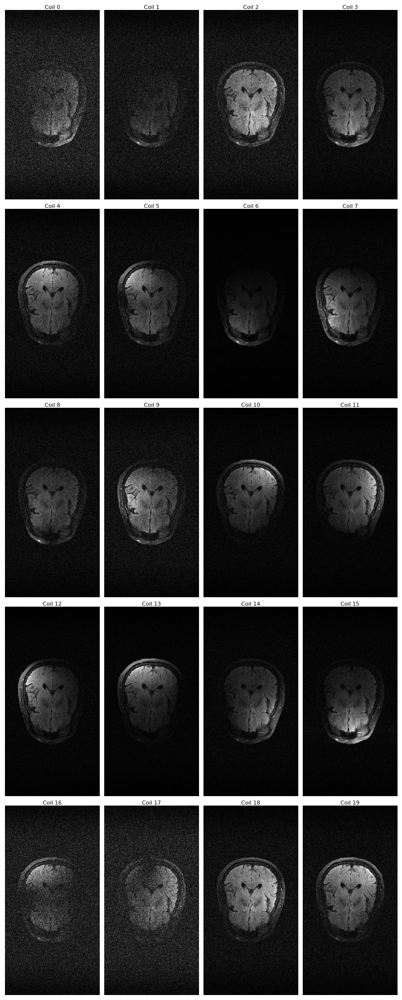

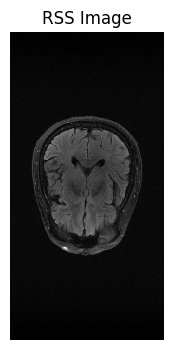

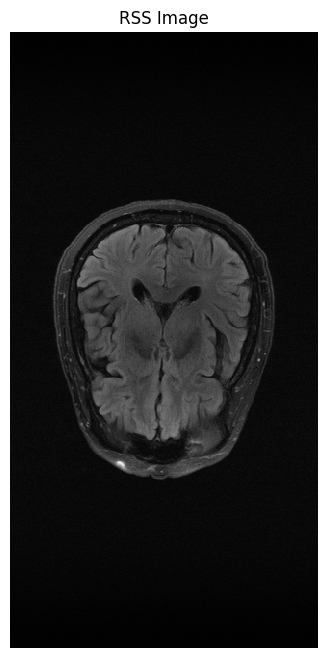

In [ ]:
# show coil grid (4 per row) and RSS below
rss = plot_rss_and_coils(slice_kspace, coil_axis=0, show_coils=True, show_rss=True, scale=4, ncols=4)

# only RSS, larger
rss = plot_rss_and_coils(slice_kspace, show_coils=False, show_rss=True, scale=8)


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

def plot_rss_and_coils(volume_kspace, coil_axis=1, slice_nos=None,
                       show_coils=True, show_rss=True,
                       scale=6, ncols=4, cmap="gray",
                       interpolation="nearest",
                       save=False, save_path="./output"):
    """
    Plot coil-wise images + RSS for selected slices from multi-coil MRI data.

    Parameters
    ----------
    volume_kspace : ndarray
        Full MRI k-space volume, shape (nslices, ncoils, nx, ny)
        or with coil axis specified.
    coil_axis : int
        Axis where coil dimension is (default=1).
    slice_nos : list[int] or None
        Which slices to plot. If None, plot all.
    show_coils : bool
        Show coil-wise images in a grid.
    show_rss : bool
        Show RSS image.
    scale : float
        Base scaling factor for figure size.
    ncols : int
        Columns for coil grid.
    cmap : str
        Colormap for imshow.
    interpolation : str
        Interpolation for imshow.
    save : bool
        Whether to save plots instead of showing.
    save_path : str
        Directory path where images are saved.

    Returns
    -------
    rss_images : dict
        {slice_no: rss_image (ndarray)} for all plotted slices.
    """
    nslices = volume_kspace.shape[0]

    if slice_nos is None:
        slice_nos = list(range(nslices))
    elif isinstance(slice_nos, int):
        slice_nos = [slice_nos]

    # create save directory if needed
    if save:
        os.makedirs(save_path, exist_ok=True)

    rss_results = {}

    for s in slice_nos:
        slice_kspace = volume_kspace[s]

        # move coil axis to front
        if coil_axis != 0:
            slice_kspace = np.moveaxis(slice_kspace, coil_axis, 0)
        ncoils, nx, ny = slice_kspace.shape

        # coil images
        coil_images = np.fft.ifftshift(
            np.fft.ifft2(np.fft.fftshift(slice_kspace, axes=(-2, -1)), axes=(-2, -1)),
            axes=(-2, -1)
        )
        coil_images = np.abs(coil_images)

        # RSS
        rss_img = np.sqrt(np.sum(coil_images**2, axis=0))
        rss_results[s] = rss_img

        # helper: figsize by aspect
        def figsize_for_image(h_pixels, w_pixels, base_height):
            aspect = w_pixels / h_pixels
            h_in = base_height
            w_in = base_height * aspect
            return (w_in, h_in)

        # Coil grid (all coils together in one image)
        if show_coils:
            imgs = coil_images
            nimgs = imgs.shape[0]
            cols = ncols
            rows = int(np.ceil(nimgs / cols))
            single_w, single_h = figsize_for_image(nx, ny, scale)
            fig_w = single_w * cols
            fig_h = single_h * rows
            fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h),
                                     squeeze=False, constrained_layout=True)
            axes_flat = axes.flatten()
            for i in range(rows*cols):
                ax = axes_flat[i]
                if i < nimgs:
                    im = imgs[i] / np.max(imgs[i]) if np.max(imgs[i]) > 0 else imgs[i]
                    ax.imshow(im, cmap=cmap, interpolation=interpolation, aspect='equal')
                    ax.set_title(f"Slice {s}, Coil {i}", fontsize=8, pad=2)
                ax.axis("off")
            if save:
                fname = os.path.join(save_path, f"slice_{s:03d}_all_coils.png")
                plt.savefig(fname, dpi=150, bbox_inches="tight")
                plt.close(fig)
            else:
                plt.show()

        # Coil-wise single images (each saved separately with slice+coil info)
        if show_coils and save:
            for c in range(ncoils):
                im = coil_images[c]
                disp_img = im / np.max(im) if np.max(im) > 0 else im
                w, h = figsize_for_image(nx, ny, scale)
                fig, ax = plt.subplots(figsize=(w, h))
                ax.imshow(disp_img, cmap=cmap, interpolation=interpolation, aspect='equal')
                ax.axis("off")
                ax.set_title(f"Slice {s}, Coil {c}", pad=6)
                fname = os.path.join(save_path, f"slice_{s:03d}_coil_{c:02d}.png")
                plt.savefig(fname, dpi=150, bbox_inches="tight")
                plt.close(fig)

        # RSS
        if show_rss:
            w, h = figsize_for_image(nx, ny, scale)
            fig, ax = plt.subplots(figsize=(w, h))
            disp_img = rss_img / np.max(rss_img) if np.max(rss_img) > 0 else rss_img
            ax.imshow(disp_img, cmap=cmap, interpolation=interpolation, aspect='equal')
            ax.axis("off")
            ax.set_title(f"Slice {s} - RSS", pad=6)
            if save:
                fname = os.path.join(save_path, f"slice_{s:03d}_rss.png")
                plt.savefig(fname, dpi=150, bbox_inches="tight")
                plt.close(fig)
            else:
                plt.show()

    return rss_results


## Mask Functions

In [ ]:
# import numpy as np

# def kspace_mask(kspace, mask_type="uniform", zero_fill=True, **kwargs):
#     """
#     Apply a k-space mask to MRI data.

#     Parameters:
#     - kspace: np.ndarray, shape (nx, ny) or (nslices, ncoils, nx, ny)
#     - mask_type: str, one of:
#         "uniform", "variable_density", "cartesian_1d",
#         "low_pass", "high_pass", "band_pass"
#     - zero_fill: bool, if True keep shape, else return coordinates only
#     - kwargs: extra parameters depending on mask_type:
#         - prob: for uniform random (default 0.5)
#         - p_center, p_edge: for variable_density (default 0.8,0.1)
#         - factor, axis: for cartesian_1d (default 2, 0)
#         - radius_fraction: for low/high_pass (default 0.25)
#         - r_inner, r_outer: for band_pass (default 0.25,0.5)

#     Returns:
#     - mask array (same shape as kspace) if zero_fill=True
#     - coordinates of sampled points if zero_fill=False
#     """
#     # Handle multi-slice/multi-coil
#     is_multi = kspace.ndim == 4
#     if not is_multi:
#         kspace = kspace[np.newaxis, np.newaxis, ...]  # shape (1,1,nx,ny)

#     nslices, ncoils, nx, ny = kspace.shape
#     masked_kspace = []

#     for s in range(nslices):
#         slice_masked = []
#         for c in range(ncoils):
#             if mask_type == "uniform":
#                 prob = kwargs.get("prob", 0.5)
#                 mask = np.random.rand(nx, ny) < prob

#             elif mask_type == "variable_density":
#                 p_center = kwargs.get("p_center", 0.8)
#                 p_edge = kwargs.get("p_edge", 0.1)
#                 X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
#                 cx, cy = nx//2, ny//2
#                 r = np.sqrt((X-cx)**2 + (Y-cy)**2)
#                 r = r / r.max()
#                 prob = p_center + (p_edge - p_center) * r
#                 mask = np.random.rand(nx, ny) < prob

#             elif mask_type == "cartesian_1d":
#                 factor = kwargs.get("factor", 2)
#                 axis = kwargs.get("axis", 0)
#                 mask = np.zeros((nx, ny), dtype=bool)
#                 if axis == 0:
#                     mask[::factor, :] = True
#                 else:
#                     mask[:, ::factor] = True

#             elif mask_type == "low_pass":
#                 radius_fraction = kwargs.get("radius_fraction", 0.25)
#                 X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
#                 cx, cy = nx//2, ny//2
#                 r = np.sqrt((X-cx)**2 + (Y-cy)**2)
#                 r_max = min(nx, ny)//2
#                 mask = r <= radius_fraction * r_max

#             elif mask_type == "high_pass":
#                 radius_fraction = kwargs.get("radius_fraction", 0.25)
#                 X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
#                 cx, cy = nx//2, ny//2
#                 r = np.sqrt((X-cx)**2 + (Y-cy)**2)
#                 r_max = min(nx, ny)//2
#                 mask = r >= radius_fraction * r_max

#             elif mask_type == "band_pass":
#                 r_inner = kwargs.get("r_inner", 0.25)
#                 r_outer = kwargs.get("r_outer", 0.5)
#                 X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
#                 cx, cy = nx//2, ny//2
#                 r = np.sqrt((X-cx)**2 + (Y-cy)**2)
#                 r_max = min(nx, ny)//2
#                 mask = (r >= r_inner * r_max) & (r <= r_outer * r_max)

#             else:
#                 raise ValueError(f"Unknown mask_type: {mask_type}")

#             if zero_fill:
#                 slice_masked.append(mask.astype(float) * kspace[s, c])
#             else:
#                 coords = np.argwhere(mask)
#                 values = kspace[s, c][mask]
#                 slice_masked.append((coords, values))

#         masked_kspace.append(slice_masked)

#     if not is_multi:
#         return masked_kspace[0][0]  # single slice, single coil

#     return masked_kspace


In [ ]:
def visualize_mask(mask, save=False, save_path="mask.png"):
    """
    Visualize a single 2D mask.
    """
    plt.imshow(mask, cmap="gray")
    plt.title("Mask")
    plt.axis("off")
    if save:
        plt.savefig(save_path, bbox_inches="tight")
    plt.show()

In [ ]:
import numpy as np

def kspace_mask_multicoil(kspace, mask_type="uniform", zero_fill=True, **kwargs):
    """
    Apply a k-space mask to all coils of multi-coil MRI data.

    Parameters:
    - kspace: np.ndarray, shape (ncoils, nx, ny)
    - mask_type: str, one of:
        "uniform", "variable_density", "cartesian_1d",
        "low_pass", "high_pass", "band_pass"
    - zero_fill: bool, if True keep shape, else return coordinates & values per coil
    - kwargs: extra parameters depending on mask_type:
        - prob: for uniform random (default 0.5)
        - p_center, p_edge: for variable_density (default 0.8,0.1)
        - factor, axis: for cartesian_1d (default 2, 0)
        - radius_fraction: for low/high_pass (default 0.25)
        - r_inner, r_outer: for band_pass (default 0.25,0.5)

    Returns:
    - masked_kspace: shape (ncoils, nx, ny) if zero_fill=True
    - list of (coords, values) per coil if zero_fill=False
    """
    ncoils, nx, ny = kspace.shape
    masked = []

    for c in range(ncoils):
        coil_kspace = kspace[c]

        if mask_type == "uniform":
            prob = kwargs.get("prob", 0.5)
            mask = np.random.rand(nx, ny) < prob

        elif mask_type == "variable_density":
            p_center = kwargs.get("p_center", 0.8)
            p_edge = kwargs.get("p_edge", 0.1)
            X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
            cx, cy = nx//2, ny//2
            r = np.sqrt((X-cx)**2 + (Y-cy)**2) / np.sqrt(cx**2 + cy**2)
            prob = p_center + (p_edge - p_center) * r
            mask = np.random.rand(nx, ny) < prob

        elif mask_type == "cartesian_1d":
            factor = kwargs.get("factor", 2)
            axis = kwargs.get("axis", 0)
            mask = np.zeros((nx, ny), dtype=bool)
            if axis == 0:
                mask[::factor, :] = True
            else:
                mask[:, ::factor] = True

        elif mask_type == "low_pass":
            radius_fraction = kwargs.get("radius_fraction", 0.25)
            X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
            cx, cy = nx//2, ny//2
            r = np.sqrt((X-cx)**2 + (Y-cy)**2)
            r_max = min(nx, ny)//2
            mask = r <= radius_fraction * r_max

        elif mask_type == "high_pass":
            radius_fraction = kwargs.get("radius_fraction", 0.25)
            X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
            cx, cy = nx//2, ny//2
            r = np.sqrt((X-cx)**2 + (Y-cy)**2)
            r_max = min(nx, ny)//2
            mask = r >= radius_fraction * r_max

        elif mask_type == "band_pass":
            r_inner = kwargs.get("r_inner", 0.25)
            r_outer = kwargs.get("r_outer", 0.5)
            X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
            cx, cy = nx//2, ny//2
            r = np.sqrt((X-cx)**2 + (Y-cy)**2)
            r_max = min(nx, ny)//2
            mask = (r >= r_inner * r_max) & (r <= r_outer * r_max)

        else:
            raise ValueError(f"Unknown mask_type: {mask_type}")

        if zero_fill:
            masked.append(coil_kspace * mask.astype(float))
        else:
            coords = np.argwhere(mask)
            values = coil_kspace[mask]
            masked.append((coords, values))

    if zero_fill:
        return np.array(masked)  # shape: (ncoils, nx, ny)
    else:
        return masked  # list of (coords, values) per coil


In [ ]:
# kspace shape: (nx, ny)
kspace_masked = kspace_mask_multicoil(slice_kspace, mask_type="variable_density", zero_fill=True)
kspace_masked = kspace_mask_multicoil(slice_kspace, mask_type="variable_density", zero_fill=True)
print(kspace_masked.shape)

slice_index = 0
slice_kspace = kspace_masked

plot_rss_and_coils(np.array([slice_kspace]), coil_axis=0, slice_nos=None)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def visualize_mask(mask, save=False, save_path="mask.png"):
    """
    Visualize a single 2D mask.
    """
    plt.imshow(mask, cmap="gray")
    plt.title("Mask")
    plt.axis("off")
    if save:
        plt.savefig(save_path, bbox_inches="tight")
    plt.show()


def plot_kspace_and_images(slice_kspace, show_type="both",
                           coil_axis=0, add_labels=True,
                           label_inside=False, wgap=0.05, hgap=0.2,
                           save=False, save_path_prefix="slice"):
    """
    Plot k-space and/or reconstructed images for multi-coil data.
    """
    if coil_axis != 0:
        slice_kspace = np.moveaxis(slice_kspace, coil_axis, 0)

    ncoils, nx, ny = slice_kspace.shape
    slice_images = np.fft.ifftshift(
        np.fft.ifft2(np.fft.fftshift(slice_kspace, axes=(-2, -1)), axes=(-2, -1)),
        axes=(-2, -1)
    )
    slice_images = np.abs(slice_images)

    imgs, labels, filenames = [], [], []
    for c in range(ncoils):
        if show_type in ["kspace", "both"]:
            imgs.append(np.log1p(np.abs(slice_kspace[c])))
            labels.append(f"Coil {c} K-space")
            filenames.append(f"{save_path_prefix}_coil{c}_kspace.png")
        if show_type in ["image", "both"]:
            imgs.append(slice_images[c])
            labels.append(f"Coil {c} Image")
            filenames.append(f"{save_path_prefix}_coil{c}_image.png")

    nimgs = len(imgs)
    ncols = 4
    nrows = int(np.ceil(nimgs / ncols))
    aspect_ratio = ny / nx
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*5*aspect_ratio, nrows*5))
    axes = axes.flatten()

    for i, (im, lab) in enumerate(zip(imgs, labels)):
        axes[i].imshow(im / np.max(im), cmap="gray", aspect="auto")
        axes[i].axis("off")
        if add_labels:
            if label_inside:
                axes[i].text(0.5, 0.05, lab, ha="center", va="bottom", fontsize=8,
                             color="white", transform=axes[i].transAxes,
                             bbox=dict(facecolor="black", alpha=0.5, pad=1, edgecolor="none"))
            else:
                axes[i].set_title(lab, fontsize=8)
        if save:
            plt.imsave(filenames[i], im / np.max(im), cmap="gray")

    for j in range(i+1, len(axes)):
        axes[j].axis("off")

    plt.subplots_adjust(wspace=wgap, hspace=hgap)
    plt.show()


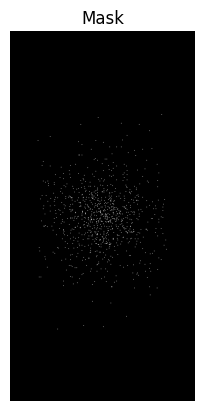

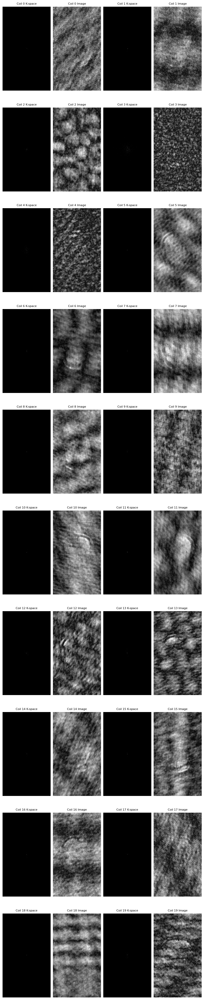

In [ ]:
# Apply mask
kspace_masked = kspace_mask_multicoil(slice_kspace, mask_type="variable_density", zero_fill=True)
mask = np.abs(kspace_masked[0]) > 0  # visualize mask for first coil

# Show and optionally save mask
visualize_mask(mask, save=True, save_path="coil0_mask.png")

# Plot k-space + images for all coils and save
plot_kspace_and_images(kspace_masked, show_type="both", save=True, save_path_prefix="slice0")


In [ ]:
import numpy as np

def kspace_mask_multicoil(kspace, mask_type="uniform_random", zero_fill=True, **kwargs):
    """
    Apply a k-space mask to all coils of multi-coil MRI data.

    Parameters:
    - kspace: np.ndarray, shape (ncoils, nx, ny)
    - mask_type: str, one of:
        "uniform_random", "variable_density", "1D_cartesian", "2D_cartesian",
        "radial", "golden_angle", "spiral", "poisson_disk", "checkerboard",
        "low_pass", "high_pass", "band_pass"
    - zero_fill: bool, if True keep shape, else return coordinates & values per coil
    - kwargs: extra parameters depending on mask_type

    Returns:
    - masked_kspace: np.ndarray (ncoils, nx, ny) if zero_fill=True
    - list of (coords, values) per coil if zero_fill=False
    """
    ncoils, nx, ny = kspace.shape
    masked = []

    for c in range(ncoils):
        coil_kspace = kspace[c]

        # ----------- MASK GENERATION -----------------
        if mask_type == "uniform_random":
            prob = kwargs.get("prob", 0.5)
            mask = np.random.rand(nx, ny) < prob

        elif mask_type == "variable_density":
            p_center = kwargs.get("p_center", 0.8)
            p_edge = kwargs.get("p_edge", 0.1)
            X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
            cx, cy = nx//2, ny//2
            r = np.sqrt((X-cx)**2 + (Y-cy)**2) / np.sqrt(cx**2 + cy**2)
            prob = p_center + (p_edge - p_center) * r
            mask = np.random.rand(nx, ny) < prob

        elif mask_type == "1D_cartesian":
            factor = kwargs.get("factor", 2)
            axis = kwargs.get("axis", 0)
            mask = np.zeros((nx, ny), dtype=bool)
            if axis == 0:
                mask[::factor, :] = True
            else:
                mask[:, ::factor] = True

        elif mask_type == "2D_cartesian":
            factor_x = kwargs.get("factor_x", 2)
            factor_y = kwargs.get("factor_y", 2)
            mask = np.zeros((nx, ny), dtype=bool)
            mask[::factor_x, ::factor_y] = True

        elif mask_type == "radial":
            n_spokes = kwargs.get("n_spokes", 20)
            mask = np.zeros((nx, ny), dtype=bool)
            cx, cy = nx//2, ny//2
            angles = np.linspace(0, np.pi, n_spokes, endpoint=False)
            for theta in angles:
                x = np.arange(nx) - cx
                y = np.round(np.tan(theta) * x).astype(int)
                valid = (y + cy >= 0) & (y + cy < ny)
                mask[x[valid]+cx, y[valid]+cy] = True

        elif mask_type == "golden_angle":
            # simplified radial golden angle mask
            n_spokes = kwargs.get("n_spokes", 20)
            mask = np.zeros((nx, ny), dtype=bool)
            cx, cy = nx//2, ny//2
            golden_angle = np.pi * (3 - np.sqrt(5))
            for i in range(n_spokes):
                theta = i * golden_angle
                x = np.arange(nx) - cx
                y = np.round(np.tan(theta) * x).astype(int)
                valid = (y + cy >= 0) & (y + cy < ny)
                mask[x[valid]+cx, y[valid]+cy] = True

        elif mask_type == "spiral":
            # simple Archimedean spiral sampling
            n_arms = kwargs.get("n_arms", 5)
            mask = np.zeros((nx, ny), dtype=bool)
            cx, cy = nx//2, ny//2
            r_max = min(cx, cy)
            theta = np.linspace(0, 4*np.pi, nx)
            for i in range(n_arms):
                x = (cx + (r_max * theta/(4*np.pi)) * np.cos(theta + i*2*np.pi/n_arms)).astype(int)
                y = (cy + (r_max * theta/(4*np.pi)) * np.sin(theta + i*2*np.pi/n_arms)).astype(int)
                valid = (x >= 0) & (x < nx) & (y >= 0) & (y < ny)
                mask[x[valid], y[valid]] = True

        elif mask_type == "poisson_disk":
            # simplified approximation: random points with min distance
            n_samples = kwargs.get("n_samples", nx*ny//4)
            mask = np.zeros((nx, ny), dtype=bool)
            points = np.random.choice(nx*ny, n_samples, replace=False)
            mask[np.unravel_index(points, (nx, ny))] = True

        elif mask_type == "checkerboard":
            mask = np.indices((nx, ny)).sum(axis=0) % 2 == 0

        elif mask_type == "low_pass":
            radius_fraction = kwargs.get("radius_fraction", 0.25)
            X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
            cx, cy = nx//2, ny//2
            r = np.sqrt((X-cx)**2 + (Y-cy)**2)
            r_max = min(nx, ny)//2
            mask = r <= radius_fraction * r_max

        elif mask_type == "high_pass":
            radius_fraction = kwargs.get("radius_fraction", 0.25)
            X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
            cx, cy = nx//2, ny//2
            r = np.sqrt((X-cx)**2 + (Y-cy)**2)
            r_max = min(nx, ny)//2
            mask = r >= radius_fraction * r_max

        elif mask_type == "band_pass":
            r_inner = kwargs.get("r_inner", 0.25)
            r_outer = kwargs.get("r_outer", 0.5)
            X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
            cx, cy = nx//2, ny//2
            r = np.sqrt((X-cx)**2 + (Y-cy)**2)
            r_max = min(nx, ny)//2
            mask = (r >= r_inner*r_max) & (r <= r_outer*r_max)

        else:
            raise ValueError(f"Unknown mask_type: {mask_type}")

        # ----------- APPLY MASK -----------------
        if zero_fill:
            masked.append(coil_kspace * mask.astype(float))
        else:
            coords = np.argwhere(mask)
            values = coil_kspace[mask]
            masked.append((coords, values))

    return np.array(masked) if zero_fill else masked


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ------------------------------
# 1️⃣ Apply mask to multi-coil k-space
# ------------------------------
def apply_mask_multicoil(kspace, mask_type="uniform", zero_fill=True, **kwargs):
    """
    Apply a mask to multi-coil k-space.

    Returns:
    - masked_kspace: shape (ncoils, nx, ny) if zero_fill=True
    - list of (coords, values) per coil if zero_fill=False
    """
    ncoils, nx, ny = kspace.shape
    masked = []

    for c in range(ncoils):
        coil_kspace = kspace[c]
        mask = generate_mask(coil_kspace.shape, mask_type=mask_type, **kwargs)

        if zero_fill:
            masked.append(coil_kspace * mask.astype(float))
        else:
            coords = np.argwhere(mask)
            values = coil_kspace[mask]
            masked.append((coords, values))

    return np.array(masked) if zero_fill else masked

# ------------------------------
# 2️⃣ Mask generator
# ------------------------------
def generate_mask(shape, mask_type="uniform", **kwargs):
    nx, ny = shape
    X, Y = np.meshgrid(np.arange(nx), np.arange(ny), indexing='ij')
    cx, cy = nx//2, ny//2
    r = np.sqrt((X-cx)**2 + (Y-cy)**2)
    r_max = min(nx, ny)//2

    if mask_type == "uniform":
        prob = kwargs.get("prob", 0.5)
        mask = np.random.rand(nx, ny) < prob
    elif mask_type == "variable_density":
        p_center = kwargs.get("p_center", 0.8)
        p_edge = kwargs.get("p_edge", 0.1)
        rr = r / r_max
        prob = p_center + (p_edge - p_center) * rr
        mask = np.random.rand(nx, ny) < prob
    elif mask_type == "low_pass":
        radius_fraction = kwargs.get("radius_fraction", 0.25)
        mask = r <= radius_fraction * r_max
    elif mask_type == "high_pass":
        radius_fraction = kwargs.get("radius_fraction", 0.25)
        mask = r >= radius_fraction * r_max
    elif mask_type == "band_pass":
        r_inner = kwargs.get("r_inner", 0.25)
        r_outer = kwargs.get("r_outer", 0.5)
        mask = (r >= r_inner * r_max) & (r <= r_outer * r_max)
    else:
        raise ValueError(f"Unknown mask_type: {mask_type}")

    return mask

# # ------------------------------
# # 3️⃣ Plot mask and RSS image
# # ------------------------------
# def plot_mask_and_rss(masked_kspace, show_coils=True, show_rss=True):
#     ncoils = masked_kspace.shape[0]

#     if show_coils:
#         plt.figure(figsize=(15, 3))
#         for c in range(ncoils):
#             plt.subplot(1, ncoils, c+1)
#             mask_img = np.abs(masked_kspace[c]) > 0
#             plt.imshow(mask_img, cmap="gray")
#             plt.title(f"Coil {c}")
#             plt.axis('off')
#         plt.show()

#     if show_rss:
#         rss_image = np.sqrt(np.sum(np.abs(np.fft.ifft2(np.fft.ifftshift(masked_kspace, axes=(-2,-1))))**2, axis=0))
#         plt.figure(figsize=(5,5))
#         plt.imshow(np.abs(rss_image), cmap="gray")
#         plt.title("RSS Image")
#         plt.axis('off')
#         plt.show()


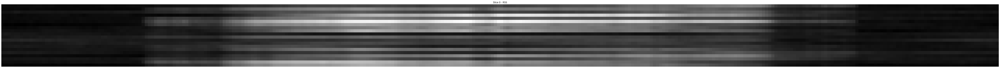

{0: array([[1.48964743e-06, 1.47238469e-06, 1.48652389e-06, ...,
         1.53514516e-06, 1.51258533e-06, 1.48880406e-06],
        [1.40947761e-06, 1.39542334e-06, 1.35817292e-06, ...,
         1.40557038e-06, 1.43511880e-06, 1.41826885e-06],
        [1.72449495e-06, 1.70577411e-06, 1.69577095e-06, ...,
         1.74452513e-06, 1.78494288e-06, 1.76925603e-06],
        ...,
        [1.74339745e-06, 1.76309180e-06, 1.72606693e-06, ...,
         1.76292379e-06, 1.79289745e-06, 1.74161286e-06],
        [1.54924963e-06, 1.57213706e-06, 1.58613166e-06, ...,
         1.56776076e-06, 1.55894623e-06, 1.51460825e-06],
        [1.27762391e-06, 1.28115850e-06, 1.35152705e-06, ...,
         1.34843136e-06, 1.35241063e-06, 1.32044814e-06]])}

In [ ]:
mask_types = [
    "uniform_random", "variable_density", "1D_cartesian", "2D_cartesian",
    "radial", "golden_angle", "spiral", "poisson_disk", "checkerboard",
    "low_pass", "high_pass", "band_pass"
]

masked_kspace = apply_mask_multicoil(volume_kspace[0], mask_type="variable_density", zero_fill=True, p_center=0.8, p_edge=0.1)
plot_rss_and_coils(np.array([masked_kspace]), show_coils=False, show_rss=True)


In [ ]:
import os

# Define mask types and zero_fill modes
mask_types = [
    "uniform",
    "variable_density",
    "low_pass",
    "high_pass",
    "band_pass"
]
zero_fill_modes = [True, False]

# Folder to save images
save_dir = "mask_rss_results"
os.makedirs(save_dir, exist_ok=True)

for mask_type in mask_types:
    for zero_fill in zero_fill_modes:
        print(f"Processing mask: {mask_type}, zero_fill={zero_fill}")
        try:
            # Apply mask
            masked_kspace = apply_mask_multicoil(volume_kspace[0], mask_type=mask_type, zero_fill=zero_fill)

            if zero_fill:
                # Plot and save mask for first coil
                mask_img = np.abs(masked_kspace[0]) > 0
                plt.figure(figsize=(5,5))
                plt.imshow(mask_img, cmap="gray")
                plt.title(f"{mask_type} mask, coil 0")
                plt.axis('off')
                plt.savefig(os.path.join(save_dir, f"mask_{mask_type}_zf{zero_fill}.png"))
                plt.close()

                # Plot RSS image
                rss_image = np.sqrt(np.sum(np.abs(np.fft.ifft2(np.fft.ifftshift(masked_kspace, axes=(-2,-1))))**2, axis=0))
                plt.figure(figsize=(5,5))
                plt.imshow(np.abs(rss_image), cmap="gray")
                plt.title(f"RSS: {mask_type}")
                plt.axis('off')
                plt.savefig(os.path.join(save_dir, f"rss_{mask_type}_zf{zero_fill}.png"))
                plt.close()
            else:
                print(f"Skipping mask/RSS plotting for data-reduction mode: {mask_type}")

        except Exception as e:
            print(f"Error processing {mask_type} with zero_fill={zero_fill}: {e}")


Processing mask: uniform, zero_fill=True
Processing mask: uniform, zero_fill=False
Skipping mask/RSS plotting for data-reduction mode: uniform
Processing mask: variable_density, zero_fill=True
Processing mask: variable_density, zero_fill=False
Skipping mask/RSS plotting for data-reduction mode: variable_density
Processing mask: low_pass, zero_fill=True
Processing mask: low_pass, zero_fill=False
Skipping mask/RSS plotting for data-reduction mode: low_pass
Processing mask: high_pass, zero_fill=True
Processing mask: high_pass, zero_fill=False
Skipping mask/RSS plotting for data-reduction mode: high_pass
Processing mask: band_pass, zero_fill=True
Processing mask: band_pass, zero_fill=False
Skipping mask/RSS plotting for data-reduction mode: band_pass


In [ ]:
mask_types = [
    "variable_density",  # already implemented
    "radial",
    "spiral",
    "low_pass",
    "high_pass",
    "band_pass",
    "checkerboard",
]


zero_fill_options = [True]  # zero-fill vs data-reduction



Testing mask: uniform_random, zero_fill=True


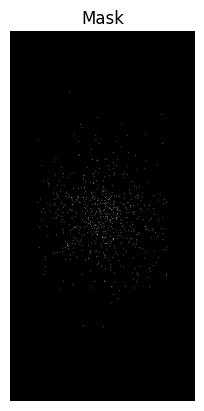

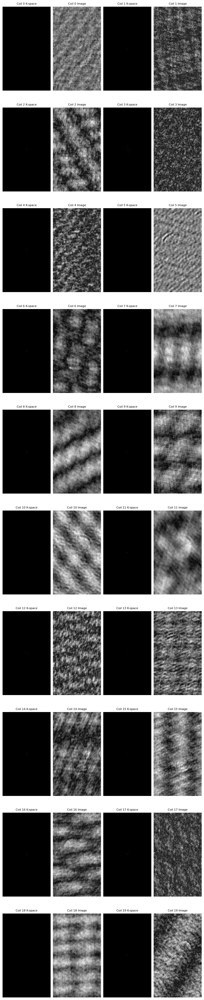

Testing mask: uniform_random, zero_fill=False
Skipping visualization for data-reduction mask: uniform_random


AttributeError: 'list' object has no attribute 'shape'

In [ ]:
for mask_type in mask_types:
    for zero_fill in zero_fill_options:
        print(f"Testing mask: {mask_type}, zero_fill={zero_fill}")

        # Apply mask to all coils
        kspace_masked = kspace_mask_multicoil(slice_kspace, mask_type=mask_type, zero_fill=zero_fill)

        if zero_fill:
            mask = np.abs(kspace_masked[0]) > 0
            visualize_mask(mask, save=True, save_path=f"mask_{mask_type}_zf{zero_fill}.png")
        else:
            print(f"Skipping visualization for data-reduction mask: {mask_type}")


        # Plot k-space + images for all coils
        plot_kspace_and_images(
            kspace_masked,
            show_type="both",
            coil_axis=0,
            save=True,
            save_path_prefix=f"{mask_type}_zf{zero_fill}"
        )


In [ ]:
# Now, I want to get all the list of the masks with different settings,
# Want to test them

In [ ]:
ncoils, nx, ny = slice_kspace.shape
print(ncoils, nx, ny)

20 640 320


In [ ]:
print(type(kspace_masked))           # should be <class 'numpy.ndarray'>
print(kspace_masked.shape)           # should be (ncoils, nx, ny)


<class 'numpy.ndarray'>
(20, 640, 320)


In [ ]:
plot_rss_and_coils(np.array(kspace_masked))

ValueError: not enough values to unpack (expected 3, got 2)

### Plot the k space images but normalize the distribution of data for better inference


In [ ]:
# Function to display the k-space image with normalization
def show_kspace(kspace, cmap='gray'):
  """
  Plots the k-space image after normalizing the data for each coil.

  Args:
    kspace (np.ndarray): The k-space data with shape (num_coils, freq_encoding, phase_encoding).
    cmap (str, optional): Colormap for the plot. Defaults to 'gray'.
  """
  num_coils = kspace.shape[0]

  for i in range(num_coils):
      # Compute the magnitude of the k-space data for the current coil
      kspace_magnitude = np.abs(kspace[i])

      # Normalize the k-space magnitude data for better visualization
      # Apply log transformation for better contrast of low signal areas
      normalized_kspace_magnitude = np.log(kspace_magnitude + 1e-9) # Add small epsilon to avoid log(0)

      plt.figure(figsize=(10, 10))
      plt.imshow(normalized_kspace_magnitude, cmap=cmap)
      plt.title(f'Normalized K-Space Magnitude - Coil {i+1}')
      plt.colorbar(label='Log Magnitude')
      plt.show()

# Example usage with the extracted slice_kspace
show_kspace(slice_kspace)

In [ ]:
# # prompt: I want to plot the k space images

# import matplotlib.pyplot as plt
# import numpy as np

# def plot_kspace(slice_kspace):
#   """
#   Plots the magnitude of the k-space data for each coil in a given slice.

#   Args:
#     slice_kspace (numpy.ndarray): The k-space data for a single slice with shape (num_coils, freq_encoding, phase_encoding).
#   """
#   num_coils = slice_kspace.shape[0]
#   for i in range(num_coils):
#       plt.figure(figsize=(10, 10))
#       # Plot the magnitude of the k-space for the current coil
#       plt.imshow(np.log(np.abs(slice_kspace[i]) + 1), cmap='gray')
#       plt.title(f'Magnitude of k-space data - Coil {i+1}')
#       plt.xlabel('Frequency Encoding')
#       plt.ylabel('Phase Encoding')
#       plt.colorbar(label='Log Magnitude')
#       plt.show()

# # Plot the k-space image for each coil in the selected slice
# plot_kspace(slice_kspace)

### Reconstruction

In [ ]:
def reconstruct_slice_kspace(slice_kspace):
    # Assuming slice_kspace is a NumPy array representing the k-space data
    # Replace this with your actual reconstruction algorithm

    # Example: Simple inverse Fourier transform
    try:
      import numexpr
    except ImportError:
      print("Installing numexpr...")
      !pip install numexpr
      import numexpr

    num_coils = slice_kspace.shape[0]  # Get the number of coils
    coil_images = []
    for i in range(num_coils):
        coil_image = np.fft.ifft2(slice_kspace[i])
        coil_image = np.fft.fftshift(coil_image)
        coil_images.append(coil_image)

    # Combine coil images using Root Sum of Squares (RSS)
    coil_images = np.array(coil_images)  # Convert list to array
    combined_image = np.sqrt(np.sum(np.abs(coil_images)**2, axis=0))

    return combined_image


for i in range(slice_nos):
    # Example usage (assuming slice_kspace is already defined)
    slice_kspace = volume_kspace[i]
    reconstructed_image = reconstruct_slice_kspace(slice_kspace)
    # plt.subplot(4,4,i+1)
    plt.imshow(reconstructed_image, cmap=cm.gray)
    # Display or save the reconstructed image
    # plt.imshow(reconstructed_image, cmap=cm.gray)
    plt.title('Reconstructed Image')
    plt.show()


In [ ]:
def plot_fourier_images(volume_kspace, slice_no):
    """
    Plots the Fourier transform magnitude of the k-space data for a given slice.

    Args:
        volume_kspace (np.ndarray): The volume k-space data.
        slice_no (int): The slice number to plot.
    """
    if slice_no < 0 or slice_no >= volume_kspace.shape[0]:
        print(f"Invalid slice number. Please choose a slice between 0 and {volume_kspace.shape[0] - 1}.")
        return

    slice_kspace = volume_kspace[slice_no]
    num_coils = slice_kspace.shape[0]

    plt.figure(figsize=(12, 6))

    for i in range(num_coils):
        # Compute the 2D Fourier Transform of each coil's k-space
        fourier_image = np.fft.fft2(slice_kspace[i])
        fourier_image = np.fft.fftshift(fourier_image) # Shift zero frequency to the center

        # Plot the magnitude of the Fourier Transform
        # plt.subplot(1, num_coils, i + 1)
        im = plt.imshow(np.log(np.abs(fourier_image) + 1), cmap='gray')
        plt.title(f'Coil {i+1} Sensitivity Encoded Image')
        plt.axis('off')

        # Add colorbar
        divider = make_axes_locatable(plt.gca())
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax)

        plt.tight_layout()
        plt.suptitle(f'Fourier Images for Slice {slice_no}', y=1.02)
        plt.show()



# After loading volume_kspace and getting slice_no:
plot_fourier_images(volume_kspace, slice_no)


In [ ]:
# Now, Download these Files as Individual Images

import matplotlib.pyplot as plt
def download_images(reconstructed_images, output_dir="output_images"):
    """
    Saves a list of reconstructed images as individual PNG files.

    Args:
        reconstructed_images (list): A list of numpy arrays, where each array is a reconstructed image.
        output_dir (str): The directory to save the images. Defaults to "output_images".
    """
    create_path(output_dir) # Ensure the output directory exists

    for i, image in enumerate(reconstructed_images):
        filename = os.path.join(output_dir, f"reconstructed_image_{i+1}.png")
        plt.imsave(filename, image, cmap=cm.gray)
        print(f"Saved image: {filename}")

# Assuming you have a list of reconstructed images after the loop
# For example, collect them in a list during the reconstruction loop:
reconstructed_images_list = []
for i in range(slice_nos):
    slice_kspace = volume_kspace[i]
    reconstructed_image = reconstruct_slice_kspace(slice_kspace)
    reconstructed_images_list.append(reconstructed_image)

# Call the function to download the images
download_images(reconstructed_images_list)

In [ ]:
# Download all the sensitivity maps from for one image and also the normalized k-space imges before reconstruction

import matplotlib.pyplot as plt
import numpy as np
def download_sensitivity_maps(volume_kspace, slice_no, output_dir="sensitivity_maps"):
    """
    Computes and saves sensitivity maps for each coil of a specific slice as PNG files.

    Args:
        volume_kspace (np.ndarray): The volume k-space data.
        slice_no (int): The slice number for which to compute and save sensitivity maps.
        output_dir (str): The directory to save the sensitivity map images.
                          Defaults to "sensitivity_maps".
    """
    if slice_no < 0 or slice_no >= volume_kspace.shape[0]:
        print(f"Invalid slice number. Please choose a slice between 0 and {volume_kspace.shape[0] - 1}.")
        return

    create_path(output_dir) # Ensure the output directory exists

    slice_kspace = volume_kspace[slice_no]
    num_coils = slice_kspace.shape[0]

    for i in range(num_coils):
        # Compute the 2D Fourier Transform of each coil's k-space
        fourier_image = np.fft.fft2(slice_kspace[i])
        fourier_image = np.fft.fftshift(fourier_image) # Shift zero frequency to the center

        # In a simplified sensitivity map calculation, we can consider the Fourier Transform
        # magnitude as a representation of the sensitivity profile. More accurate methods
        # might involve dividing by a reference image (e.g., a low-resolution body coil image)
        # or using dedicated sensitivity estimation algorithms.
        sensitivity_map_magnitude = np.abs(fourier_image)

        filename = os.path.join(output_dir, f"slice_{slice_no}_coil_{i+1}_sensitivity_map.png")
        plt.imsave(filename, sensitivity_map_magnitude, cmap='gray') # Save magnitude
        print(f"Saved sensitivity map: {filename}")

def download_normalized_kspace_images(volume_kspace, slice_no, output_dir="normalized_kspace_images"):
    """
    Plots and saves the normalized k-space magnitude images for each coil of a specific slice.

    Args:
        volume_kspace (np.ndarray): The volume k-space data.
        slice_no (int): The slice number for which to plot and save normalized k-space images.
        output_dir (str): The directory to save the normalized k-space images.
                          Defaults to "normalized_kspace_images".
    """
    if slice_no < 0 or slice_no >= volume_kspace.shape[0]:
        print(f"Invalid slice number. Please choose a slice between 0 and {volume_kspace.shape[0] - 1}.")
        return

    create_path(output_dir) # Ensure the output directory exists

    slice_kspace = volume_kspace[slice_no]
    num_coils = slice_kspace.shape[0]

    for i in range(num_coils):
        # Compute the magnitude of the k-space data for the current coil
        kspace_magnitude = np.abs(slice_kspace[i])

        # Normalize the k-space magnitude data for better visualization
        # Apply log transformation for better contrast of low signal areas
        normalized_kspace_magnitude = np.log(kspace_magnitude + 1e-9) # Add small epsilon to avoid log(0)

        filename = os.path.join(output_dir, f"slice_{slice_no}_coil_{i+1}_normalized_kspace.png")
        plt.imsave(filename, normalized_kspace_magnitude, cmap='gray')
        print(f"Saved normalized k-space image: {filename}")


# Assuming volume_kspace and slice_no are already defined from the previous code:

# Call the functions to download the sensitivity maps and normalized k-space images
download_sensitivity_maps(volume_kspace, slice_no)
download_normalized_kspace_images(volume_kspace, slice_no)


In [ ]:
# prompt: I also want to download all the sensitivity maps from for one image and also the k-space imges before reconstruction

import matplotlib.pyplot as plt
import numpy as np
# Function to download the sensitivity maps for a given slice
def download_sensitivity_maps(volume_kspace, slice_no, output_dir="sensitivity_maps"):
    """
    Saves the magnitude of the Fourier transform of each coil's k-space data
    for a given slice as individual PNG files.

    Args:
        volume_kspace (np.ndarray): The volume k-space data.
        slice_no (int): The slice number to plot.
        output_dir (str): The directory to save the images. Defaults to "sensitivity_maps".
    """
    create_path(output_dir)  # Ensure the output directory exists

    if slice_no < 0 or slice_no >= volume_kspace.shape[0]:
        print(f"Invalid slice number. Please choose a slice between 0 and {volume_kspace.shape[0] - 1}.")
        return

    slice_kspace = volume_kspace[slice_no]
    num_coils = slice_kspace.shape[0]

    for i in range(num_coils):
        # Compute the 2D Fourier Transform of each coil's k-space
        fourier_image = np.fft.fft2(slice_kspace[i])
        fourier_image = np.fft.fftshift(fourier_image)  # Shift zero frequency to the center

        filename = os.path.join(output_dir, f"sensitivity_map_slice_{slice_no}_coil_{i+1}.png")
        plt.imsave(filename, np.log(np.abs(fourier_image) + 1), cmap='gray')
        print(f"Saved sensitivity map: {filename}")

# Call the function to download sensitivity maps for the selected slice
download_sensitivity_maps(volume_kspace, slice_no)


# Function to download the k-space images before reconstruction for a given slice
def download_kspace_images(volume_kspace, slice_no, output_dir="kspace_images"):
    """
    Saves the magnitude of the k-space data for each coil in a given slice
    as individual PNG files.

    Args:
      volume_kspace (np.ndarray): The volume k-space data.
      slice_no (int): The slice number to plot.
      output_dir (str): The directory to save the images. Defaults to "kspace_images".
    """
    create_path(output_dir)  # Ensure the output directory exists

    if slice_no < 0 or slice_no >= volume_kspace.shape[0]:
        print(f"Invalid slice number. Please choose a slice between 0 and {volume_kspace.shape[0] - 1}.")
        return

    slice_kspace = volume_kspace[slice_no]
    num_coils = slice_kspace.shape[0]

    for i in range(num_coils):
        filename = os.path.join(output_dir, f"kspace_image_slice_{slice_no}_coil_{i+1}.png")
        plt.imsave(filename, np.log(np.abs(slice_kspace[i]) + 1), cmap='gray')
        print(f"Saved k-space image: {filename}")

# Call the function to download k-space images for the selected slice
download_kspace_images(volume_kspace, slice_no)

In [ ]:
# prompt: I want to download the images from the folder as zip

from google.colab import files

# Zip the output directories
!zip -r /content/normalized_kspace_images.zip /content/normalized_kspace_images/
!zip -r /content/reconstructed_images.zip /content/output_images/
!zip -r /content/sensitivity_maps.zip /content/sensitivity_maps/
!zip -r /content/kspace_images.zip /content/kspace_images/


# Download the zip files
files.download('/content/normalized_kspace_images.zip')
files.download('/content/reconstructed_images.zip')
files.download('/content/sensitivity_maps.zip')
files.download('/content/kspace_images.zip')